### Datasets clean

In [1]:
import pandas as pd
from datetime import datetime
import seaborn as sns
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_reviews = pd.read_csv('reviews.csv')
df_reviews.drop(['id','reviewer_name'], axis=1, inplace=True)
df_reviews.rename(columns={'date': 'review_date'}, inplace=True)
df_reviews

,listing_id,review_date,reviewer_id,comments
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...
4,3781,2015-10-30,15151513,Great value for the money! This location has e...
...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...


In [3]:
df_list= pd.read_csv('listings.csv')

In [4]:
columns_to_keep= [
    'id','neighbourhood_cleansed','price', 'latitude', 'longitude',
    'room_type', 'number_of_reviews','review_scores_rating']
df_list1= df_list[columns_to_keep]
df_list1 = df_list1.drop_duplicates()
df_list1.rename(columns={'id': 'listing_id'}, inplace=True)
df_list1

,listing_id,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,5506,Roxbury,$135.00,42.328440,-71.095810,Entire home/apt,122,4.79
2,6695,Roxbury,$179.00,42.328020,-71.093870,Entire home/apt,127,4.81
3,8789,Beacon Hill,$91.00,42.358670,-71.063070,Entire home/apt,27,4.67
4,10813,Back Bay,$86.00,42.350610,-71.087870,Entire home/apt,5,5.00
...,...,...,...,...,...,...,...,...
4199,1046563598019556549,Dorchester,$83.00,42.285236,-71.069907,Entire home/apt,1,5.00
4200,1046568292864752336,Downtown,$107.00,42.352970,-71.063690,Entire home/apt,0,NaN
4201,1047166785349446101,Fenway,$136.00,42.347480,-71.090780,Entire home/apt,0,NaN
4202,1047226383263246733,Dorchester,$83.00,42.285161,-71.067922,Entire home/apt,0,NaN


In [5]:
df = pd.merge(df_reviews, df_list1, on='listing_id', how='left')
df

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


In [6]:
df.isna().sum()

listing_id                   0
review_date                  0
reviewer_id                  0
comments                    57
neighbourhood_cleansed       0
price                     7901
latitude                     0
longitude                    0
room_type                    0
number_of_reviews            0
review_scores_rating         0
dtype: int64

In [7]:
data = df.dropna(subset=['comments'])
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


In [8]:
data['price'] = data['price'].str.replace('$', '').str.replace(',', '').astype(float)


In [9]:
price_means = data.groupby(['room_type'])['price'].transform('mean')
data['price'] = data['price'].fillna(price_means)

In [10]:
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,110.0,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,140.0,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50


In [11]:
data['review_date'] = pd.to_datetime(df['review_date'])

data= data[data['review_date'].dt.year.between(2019, 2023)]


In [12]:
comments_per_year = data['review_date'].dt.year.value_counts().sort_index()
print(comments_per_year)

review_date
2019    23636
2020     9681
2021    20950
2022    36577
2023    45533
Name: count, dtype: int64


In [13]:
data.info()
data1 = data.copy()

<class 'pandas.core.frame.DataFrame'>
Index: 136377 entries, 14 to 182481
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   listing_id              136377 non-null  int64         
 1   review_date             136377 non-null  datetime64[ns]
 2   reviewer_id             136377 non-null  int64         
 3   comments                136377 non-null  object        
 4   neighbourhood_cleansed  136377 non-null  object        
 5   price                   136377 non-null  float64       
 6   latitude                136377 non-null  float64       
 7   longitude               136377 non-null  float64       
 8   room_type               136377 non-null  object        
 9   number_of_reviews       136377 non-null  int64         
 10  review_scores_rating    136377 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), object(3)
memory usage: 12.5+ MB


In [14]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')

data['comments'] = data['comments'].str.lower()
data['comments'] = data['comments'].str.replace(r"[^\w\s']", '')
data['comments'] = data['comments'].str.replace(r'\d+', '', regex=True)
data['comments'] = data['comments'].str.replace(r'\s+', ' ', regex=True)
data['comments'] =data['comments'].str.strip()
english_words = set(nltk.corpus.words.words())

def remove_stopwords(sent):
    stop_word = set(stopwords.words('english'))
    words = word_tokenize(sent)
    filter_word = [x for x in words if x not in stop_word and len(x)>2 and x in english_words]
    return filter_word

data['comments'] = data['comments'].apply(remove_stopwords)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/jueshiderongyanm/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jueshiderongyanm/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/jueshiderongyanm/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [15]:
comments = data['comments']
list_doc = comments.tolist()

In [16]:
comments

14        [partner, stayed, frank, apartment, several, g...
15        [much, apartment, rented, frank, place, perfec...
16        [stayed, frank, apartment, three, stay, excell...
17        [wonderful, bedroom, great, location, apartmen...
18        [great, place, amazing, location, highly, reco...
                                ...                        
182477    [wonderful, location, walk, around, north, end...
182478                            [great, deal, responsive]
182479    [stay, place, great, apartment, spacious, caug...
182480     [good, place, solid, nice, park, inside, garage]
182481         [great, host, great, home, amazing, service]
Name: comments, Length: 136377, dtype: object

In [17]:
list_doc

[['partner',
  'stayed',
  'frank',
  'apartment',
  'several',
  'great',
  'experience',
  'frank',
  'accommodating',
  'thoughtful',
  'needs',
  'also',
  'giving',
  'good',
  'amount',
  'privacy',
  'location',
  'great',
  'quiet',
  'safe',
  'neighborhood',
  'would',
  'definitely',
  'stay',
  'area',
  'future',
  'thanks'],
 ['much',
  'apartment',
  'rented',
  'frank',
  'place',
  'perfectly',
  'clean',
  'every',
  'think',
  'stay',
  'boston',
  'frank',
  'great',
  'host',
  'responsive',
  'made',
  'everything',
  'facilitate',
  'stay',
  'also',
  'much',
  'neighborhood',
  'literally',
  'end',
  'street',
  'nice',
  'park',
  'min',
  'walk',
  'highly',
  'recommend',
  'everyone'],
 ['stayed',
  'frank',
  'apartment',
  'three',
  'stay',
  'excellent',
  'neighborhood',
  'lovely',
  'quiet',
  'apartment',
  'orderly',
  'clean',
  'comes',
  'need',
  'perfect',
  'long',
  'stay',
  'boston'],
 ['wonderful',
  'bedroom',
  'great',
  'location',
 

In [18]:
data1

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
14,3781,2019-02-22,83031353,My partner and I stayed at Frank's apartment f...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
15,3781,2019-12-21,3918963,I liked very much this apartment rented by Fra...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
16,3781,2020-09-03,344701185,I stayed at Frank's apartment for three months...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
17,3781,2020-12-20,348888007,Wonderful 1 bedroom with a great location! The...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
18,3781,2021-02-26,345613836,Great place - amazing location. Highly recom...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,110.0,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,140.0,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50


In [19]:
from sklearn.feature_extraction.text import CountVectorizer

In [20]:
comment = comments.apply(' '.join)
cv = CountVectorizer()
counts_word = cv.fit_transform(comment)

vocab_freq = dict(zip(cv.get_feature_names_out(), counts_word.sum(axis = 0).A1))

In [21]:
sorted_comments = sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)

sorted_comments_dict = dict(sorted_comments)
print(sorted_comments_dict)


{'great': 76617, 'stay': 63626, 'place': 62652, 'location': 51134, 'clean': 42266, 'boston': 39181, 'would': 29506, 'nice': 23348, 'apartment': 22406, 'host': 22226, 'comfortable': 21266, 'room': 20872, 'easy': 20445, 'everything': 20056, 'recommend': 19170, 'perfect': 18293, 'close': 16294, 'good': 16093, 'definitely': 16077, 'space': 14594, 'well': 14241, 'walk': 13316, 'home': 13181, 'really': 13020, 'super': 12997, 'time': 12260, 'area': 11651, 'house': 11578, 'also': 11118, 'responsive': 10954, 'beautiful': 10845, 'parking': 10670, 'quiet': 10294, 'back': 10209, 'get': 10074, 'neighborhood': 9938, 'highly': 9844, 'walking': 9390, 'amazing': 9337, 'one': 9290, 'check': 8936, 'wonderful': 8911, 'helpful': 8774, 'kitchen': 8720, 'city': 8709, 'bed': 8613, 'convenient': 8605, 'like': 8535, 'street': 8386, 'could': 8131, 'need': 7933, 'bathroom': 7764, 'night': 7651, 'communication': 7639, 'distance': 7340, 'little': 7281, 'right': 7210, 'downtown': 7164, 'lovely': 7043, 'around': 6955

In [22]:
!pip install wordcloud

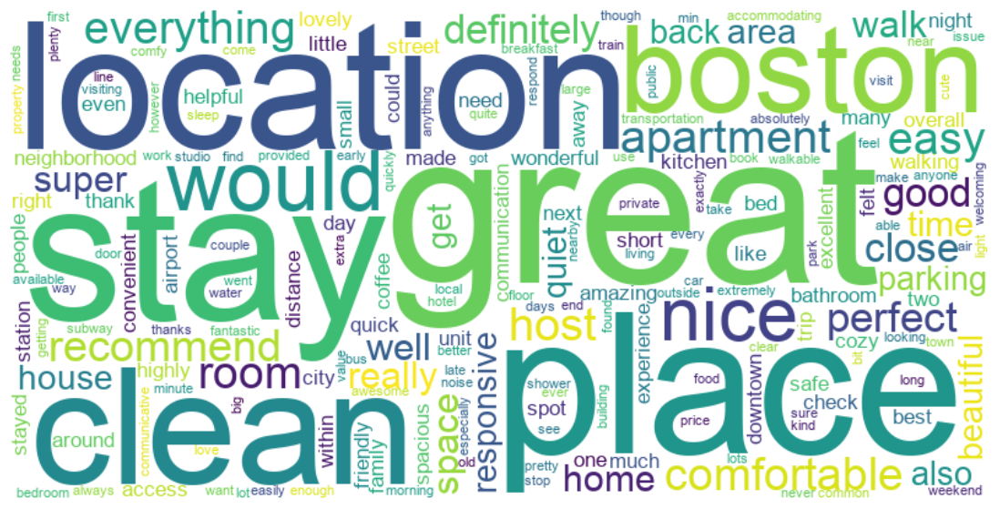

In [23]:
from wordcloud import WordCloud

font_path = '/Library/Fonts/Arial.ttf'
wordcloud = WordCloud(width=800, height=400, background_color='white', font_path=font_path)
wordcloud.generate_from_frequencies(vocab_freq)

# Display
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Alpha and Beta in LDA

In [24]:
from gensim import corpora, models
from gensim.models import CoherenceModel

comments = data['comments'].tolist()

# Creating a dictionary
dictionary = corpora.Dictionary(comments)

# Corpus needed for Topic Modeling
corpus = [dictionary.doc2bow(text) for text in comments]

# Print the words in topics with their weights
def print_topic_words(model, num_top_words):
    for topic_id in range(model.num_topics):
        words = model.show_topic(topic_id, topn=num_top_words)
        topic_words = ", ".join([word for word, _ in words])
        print(f"Topic {topic_id}: {topic_words}")

In [25]:
# model 1: LDA with symmetric alpha
lda_model1 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='symmetric')
print_topic_words(lda_model1, 10)

Topic 0: check, night, early, one, stayed, late, perfect, trip, place, boston
Topic 1: apartment, boston, street, right, end, location, walk, back, north, away
Topic 2: walk, boston, close, station, downtown, place, airport, easy, minute, train
Topic 3: would, room, night, noise, unit, bed, one, building, bathroom, floor
Topic 4: stay, would, definitely, place, recommend, boston, great, clean, location, perfect
Topic 5: best, one, could, stayed, ever, better, nothing, die, apartment, ask
Topic 6: great, place, host, location, stay, responsive, clean, helpful, super, amazing
Topic 7: home, stay, like, house, felt, host, place, made, time, thank
Topic 8: great, parking, clean, spot, location, street, comfortable, safe, quiet, area
Topic 9: parking, service, car, find, water, difficult, garage, free, hot, overnight
Topic 10: hotel, room, bathroom, bien, worth, living, kitchen, price, like, pour
Topic 11: nice, good, place, really, clean, stay, room, location, overall, house
Topic 12: easy

In [26]:
# evaluate the models using Coherence Score
coherence_model_lda1 = CoherenceModel(model=lda_model1, texts=comments, dictionary=dictionary, coherence='c_v')
coherence_lda1 = coherence_model_lda1.get_coherence()

print("\nCoherence Score for Model 1:", coherence_lda1)


Coherence Score for Model 1: 0.5809105389936738


In [27]:
# model 2: LDA with asymmetric alpha and fixed eta
lda_model2 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='asymmetric', eta=0.5)
print_topic_words(lda_model2, 10)

Topic 0: great, stay, place, location, clean, host, would, nice, responsive, everything
Topic 1: great, boston, easy, place, close, walk, location, walking, stay, distance
Topic 2: room, nice, kitchen, comfortable, space, bed, clean, bathroom, well, small
Topic 3: check, early, host, late, get, day, time, even, issue, let
Topic 4: boston, stayed, perfect, time, best, one, home, family, stay, could
Topic 5: room, place, would, night, one, good, unit, bit, noise, stay
Topic 6: coffee, water, hotel, like, sure, make, everything, even, need, place
Topic 7: back, come, end, boston, north, definitely, bay, heart, next, location
Topic 8: house, college, beautifully, old, love, friend, dog, year, thanks, son
Topic 9: thank, property, every, wonderful, hospitality, stay, much, immaculate, experience, detail
Topic 10: recommend, stay, would, place, highly, home, host, definitely, clean, beautiful
Topic 11: public, transportation, accessible, worth, transport, easily, east, pristine, mike, money


In [28]:
# evaluate the models using Coherence Score
coherence_model_lda2 = CoherenceModel(model=lda_model2, texts=comments, dictionary=dictionary, coherence='c_v')
coherence_lda2 = coherence_model_lda2.get_coherence()

print("Coherence Score for Model 2:", coherence_lda2)

Coherence Score for Model 2: 0.546997445009072


In [29]:
# model 3: LDA with auto alpha and eta
lda_model3 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='auto', eta='auto')
print_topic_words(lda_model3, 10)

Topic 0: comfy, bed, cool, look, pleasant, forward, deck, question, super, peaceful
Topic 1: room, bathroom, bed, kitchen, small, shower, one, nice, floor, comfortable
Topic 2: walk, close, station, boston, airport, downtown, train, minute, line, short
Topic 3: around, get, easy, area, place, city, nice, well, pretty, good
Topic 4: night, host, staff, could, place, time, stay, one, would, early
Topic 5: house, coffee, breakfast, experience, available, para, nice, great, attentive, provided
Topic 6: home, stay, like, felt, thank, boston, beautiful, comfortable, made, feel
Topic 7: apartment, great, location, clean, comfortable, everything, quick, well, spacious, quiet
Topic 8: recommend, host, responsive, stay, place, would, highly, helpful, clean, amazing
Topic 9: worth, money, con, die, neat, totally, ist, hotel, maria, man
Topic 10: easy, check, boston, trip, stay, perfect, access, location, place, clean
Topic 11: walking, boston, distance, location, within, great, perfect, end, ever

In [30]:
# evaluate the models using Coherence Score
coherence_model_lda3 = CoherenceModel(model=lda_model3, texts=comments, dictionary=dictionary, coherence='c_v')
coherence_lda3 = coherence_model_lda3.get_coherence()

print("Coherence Score for Model 3:", coherence_lda3)

Coherence Score for Model 3: 0.5620556102457871


### LDA Visualization

#### Word Clouds

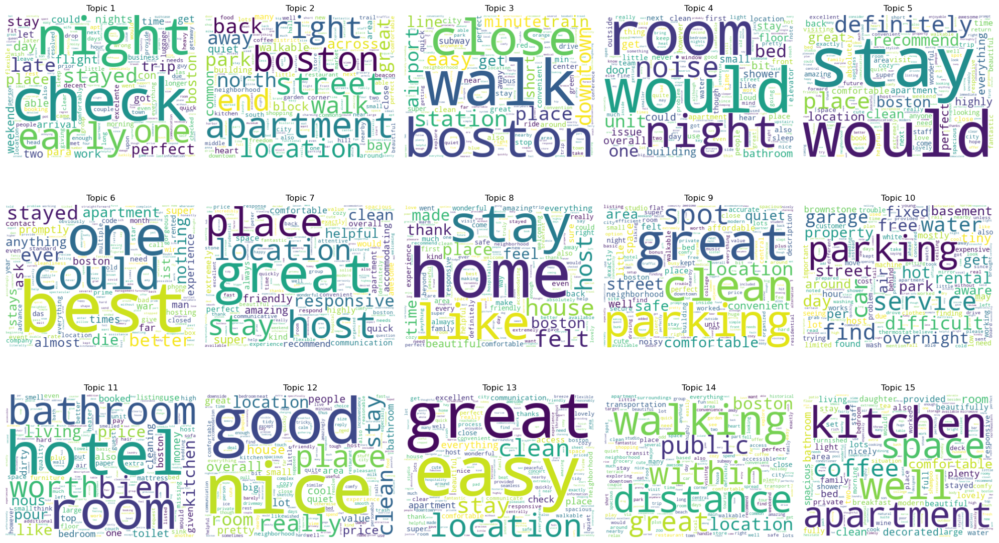

In [31]:
# model 1

import matplotlib.pyplot as plt
from wordcloud import WordCloud

num_topics = lda_model1.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model1.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

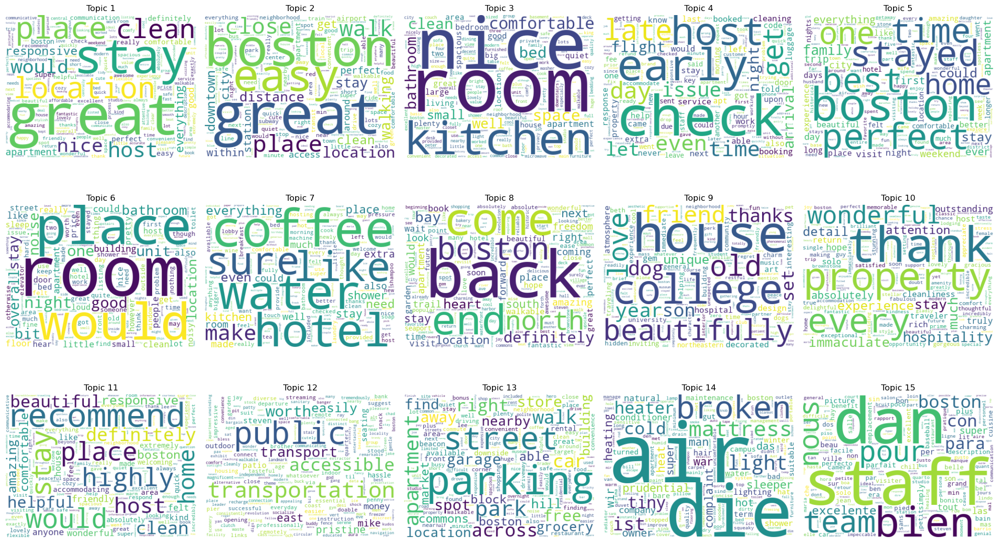

In [32]:
# model 2

num_topics = lda_model2.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model2.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

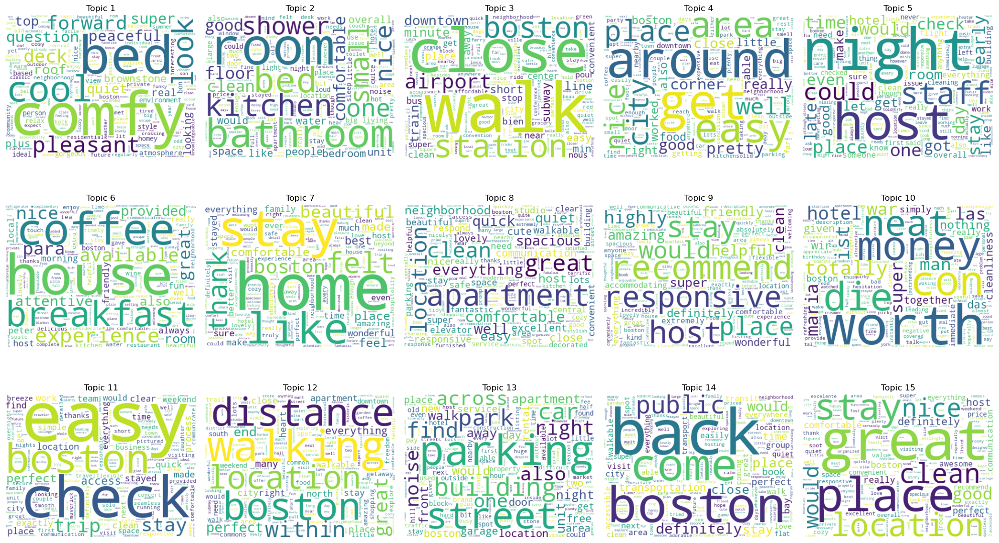

In [33]:
# model 3

num_topics = lda_model3.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model3.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

#### Using the pyLDAvis library.

In [34]:
!pip install pyLDAvis
!pip install --upgrade joblib
!pip install --upgrade pyLDAvis

In [35]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# model 1
lda_vis = gensimvis.prepare(lda_model1, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [36]:
# model 2
lda_vis = gensimvis.prepare(lda_model2, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [37]:
# model 3
lda_vis = gensimvis.prepare(lda_model3, corpus, dictionary)
pyLDAvis.display(lda_vis)